# Conductance data

In [1]:
import os
import pickle
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
import numpy as np
from numpy import NaN

def clean_outliers(df_timeseries):
    # Determine Interquartile Range (IQR)
    Q1 = np.percentile(df_timeseries, 25, interpolation = 'midpoint')
    Q3 = np.percentile(df_timeseries, 75, interpolation = 'midpoint')
    IQR = Q3 - Q1
    
    # Get upper and lower outliers indices
    upper_outliers_indices = df_timeseries >= (Q3+1.5*IQR)
    lower_outliers_indices = df_timeseries <= (Q1-1.5*IQR)
    
    # Extract outlier values
    upper_outliers = df_timeseries[np.where(upper_outliers_indices)[0]].values
    outliers = np.concatenate([upper_outliers, np.zeros(1)])
    
    # Replace outliers with NaNs and fill in via interpolation
    df_with_NaNs = df_timeseries.replace(outliers, NaN)
    df_interpolated = df_with_NaNs.interpolate(method='linear', axis=0).ffill().bfill()
    
    return df_interpolated

In [3]:
dirnames = !ls -d data/cWza*_conformation*_[0-9][0-9][0-9][0-9]

## Timeseries

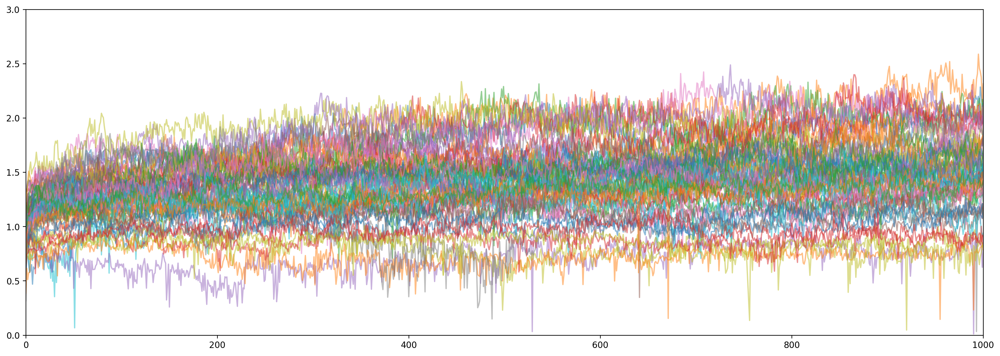

In [4]:
fig,ax = plt.subplots(1,1,figsize=(20,7),dpi=200)

HOLE_data = {}
for outdir in dirnames:
    model_name = outdir.split('/')[-1]

    with open(os.path.join(outdir, "md_100ns.hole.pickle"),'rb') as fp:
        hdata = pickle.load(fp)
        
    y = [list(hdata.values())[i][1][1] for i in range(len(hdata.keys())-1)]
    if len(y) > 0:
        df = pd.DataFrame({'test':y})
        df_new = clean_outliers(df['test'])
        df_new.plot(ax=ax,lw=1.5,alpha=0.5)
        HOLE_data[model_name] = np.array(df_new)
            
    else:
        print("ERROR: No data for model", outdir)
    
ax.set_xlim(0,1000)
ax.set_ylim(0,3)
plt.show()

In [332]:
X = HOLE_data
data_matrix = np.array([np.array(X[key]) for key in X.keys()])

## Heatmaps

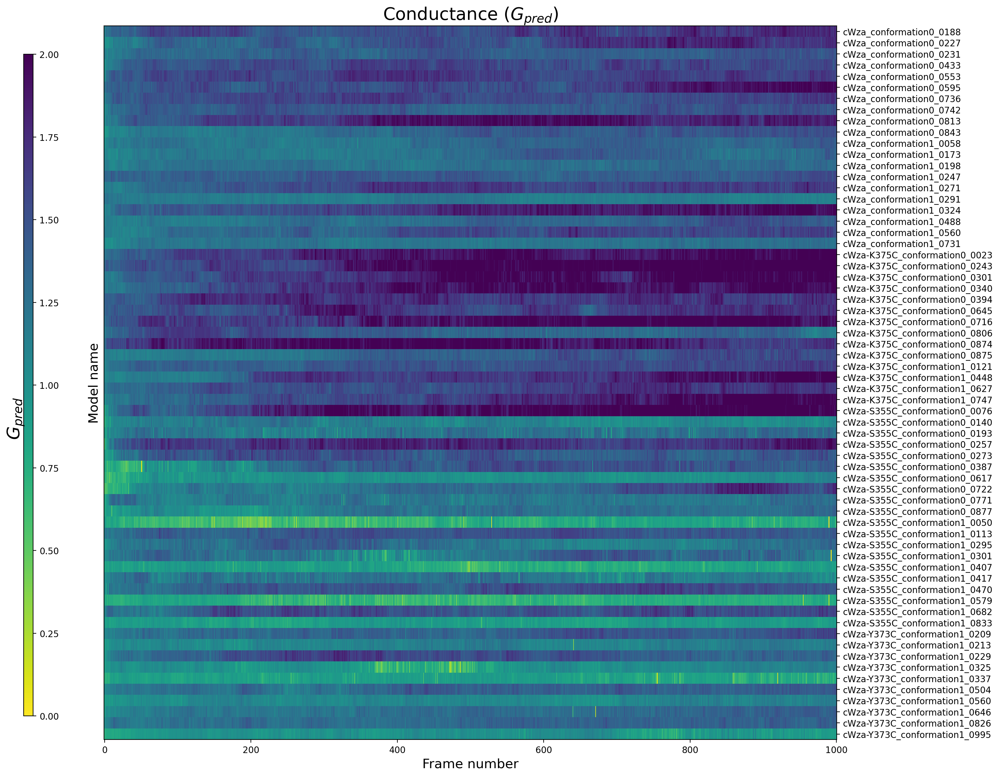

In [6]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

fig,ax = plt.subplots(1,1,figsize=(15,15),dpi=200)
im = ax.imshow(data_matrix, 
               origin='upper', 
               vmin = 0,
               vmax = 2,
               interpolation='nearest',
               aspect='auto',
               cmap='viridis_r',
               alpha=1)

# customise colorbar
cbar_ax = fig.add_axes([0.04, 0.15, 0.01, 0.7])
cbar = plt.colorbar(im, cax=cbar_ax, shrink=0.01)
cbar.set_label('$G_{pred}$', labelpad=-60, y=0.45, fontsize=20)


# custom ylabels
model_names = list(X.keys())
ax.set_yticks(range(len(model_names)))
y_labels = model_names
ax.set_yticklabels(y_labels,fontsize=10)
ax.yaxis.set_tick_params(labelright=True, right=True)
ax.yaxis.set_tick_params(labelleft=False, left=False)

ax.set_title('Conductance ($G_{pred}$)', fontsize=20)
ax.set_xlabel("Frame number", fontsize=15)
ax.set_ylabel("Model name", fontsize=15)

plt.show()

## Distributions

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Plot general distribution for all data, regardless of mutant, conformation, or model number

In [333]:
df_all = pd.DataFrame(data_matrix.T, columns=model_names)

/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


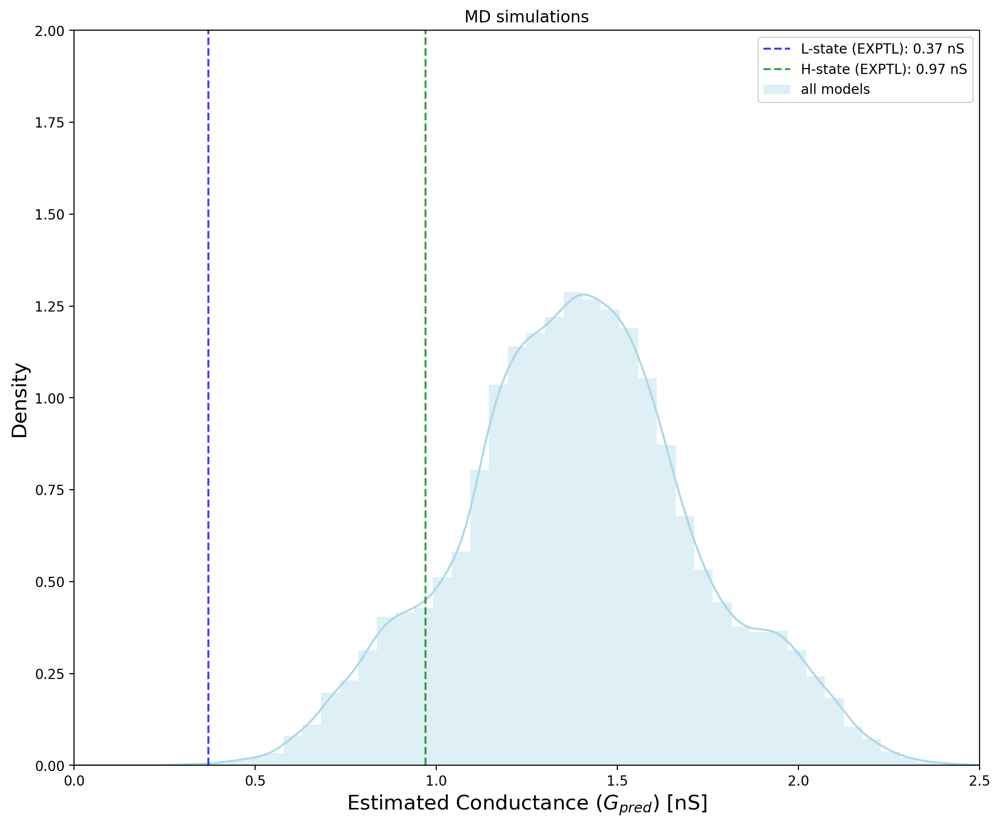

In [364]:
fig,ax = plt.subplots(1,1, figsize=(12,10),dpi=200)

sns.distplot(df_all,label='all models',color='LightBlue',ax=ax)

ax.axvline(x=0.37, label='L-state (EXPTL): 0.37 nS', color='blue', alpha=0.75, linestyle='--', lw=1.5)
ax.axvline(x=0.97, label='H-state (EXPTL): 0.97 nS', color='green', alpha=0.75, linestyle='--', lw=1.5)

ax.set_xlabel('Estimated Conductance ($G_{pred}$) [nS]',fontsize=15)
ax.set_ylabel('Density',fontsize=15)
ax.set_title('MD simulations')

ax.set_xlim(0,2.5)
ax.set_ylim(0,2)

ax.legend()
plt.show()

Split data into mutant groups

In [191]:
mutant_names = ['cWza', 'cWza-K375C', 'cWza-S355C', 'cWza-Y373C']

/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


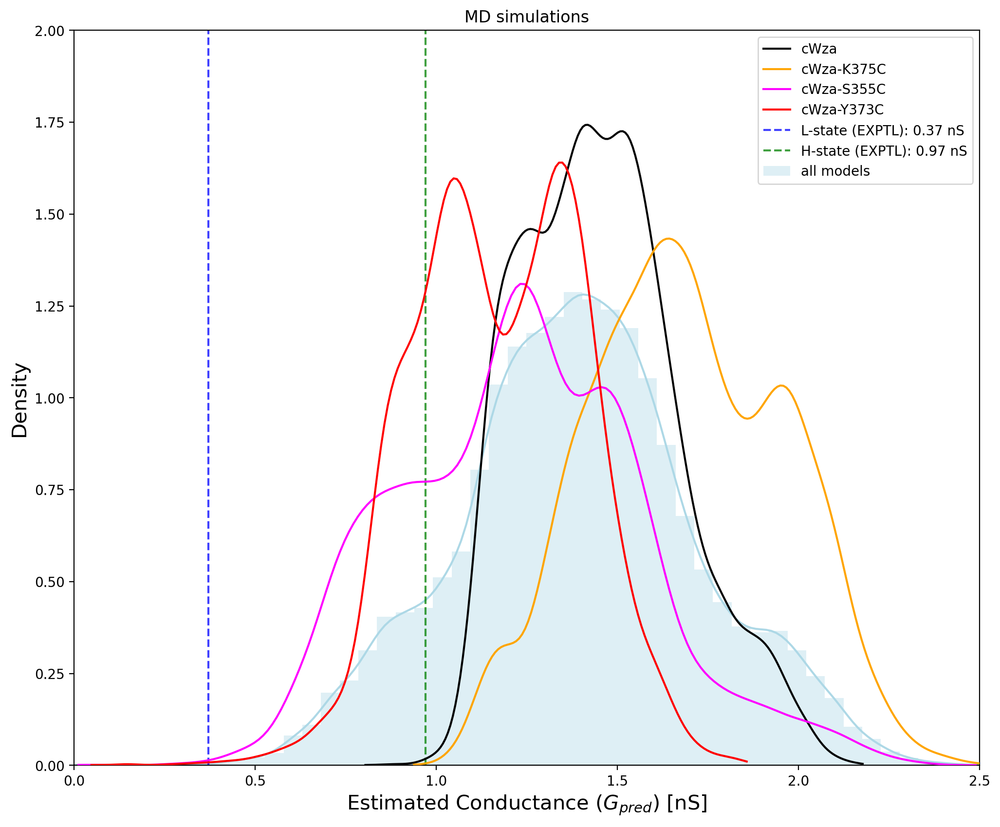

In [363]:
fig,ax = plt.subplots(1,1, figsize=(12,10),dpi=200)

for mutant in mutant_names:
    data_matrix = np.array([np.array(X[key]) for key in X.keys() if key.startswith(mutant+'_')])
    df = pd.DataFrame(np.ndarray.flatten(data_matrix))
    sns.histplot(df,stat='density',element='poly',kde=True,fill=False,ax=ax)

ax.lines[0].set_color('white')
ax.lines[0].set_zorder(-20)
ax.lines[1].set_color('black')
ax.lines[1].set_label('cWza')
ax.lines[1].set_zorder(20)

ax.lines[2].set_color('white')
ax.lines[2].set_zorder(-20)
ax.lines[3].set_color('orange')
ax.lines[3].set_label('cWza-K375C')
ax.lines[3].set_zorder(20)

ax.lines[4].set_color('white')
ax.lines[4].set_zorder(-20)
ax.lines[5].set_color('magenta')
ax.lines[5].set_label('cWza-S355C')
ax.lines[5].set_zorder(20)

ax.lines[6].set_color('white')
ax.lines[6].set_zorder(-20)
ax.lines[7].set_color('red')
ax.lines[7].set_label('cWza-Y373C')
ax.lines[7].set_zorder(20)

g = sns.distplot(df_all,label='all models',color='LightBlue',ax=ax)
g.set_zorder(-20)
g.set_alpha(0.1)

ax.axvline(x=0.37, label='L-state (EXPTL): 0.37 nS', color='blue', alpha=0.75, linestyle='--', lw=1.5)
ax.axvline(x=0.97, label='H-state (EXPTL): 0.97 nS', color='green', alpha=0.75, linestyle='--', lw=1.5)
    
ax.set_xlabel('Estimated Conductance ($G_{pred}$) [nS]',fontsize=15)
ax.set_ylabel('Density',fontsize=15)
ax.set_title('MD simulations')

ax.set_xlim(0,2.5)
ax.set_ylim(0,2)

ax.legend()
plt.show()

### Box plots

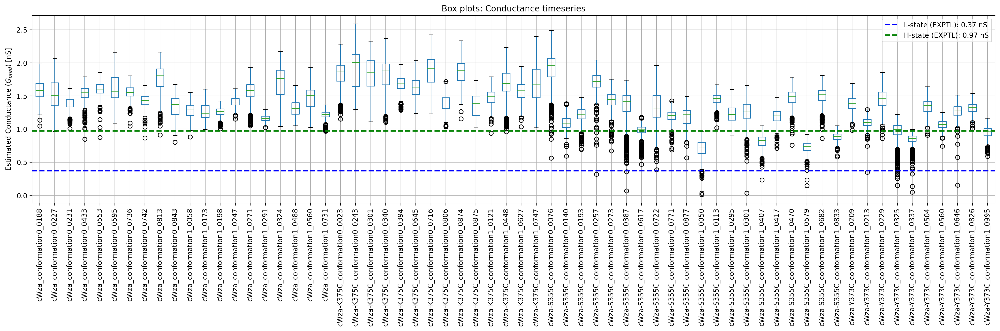

In [170]:
fig,ax = plt.subplots(1,1, figsize=(25,5),dpi=200)

df.boxplot(ax=ax)
ax.tick_params(axis='x', rotation=90)

ax.axhline(y=0.37, label='L-state (EXPTL): 0.37 nS', color='blue', linestyle='--', lw=2)
ax.axhline(y=0.97, label='H-state (EXPTL): 0.97 nS', color='green', linestyle='--', lw=2)

ax.set_title('Box plots: Conductance timeseries')
ax.set_ylabel('Estimated Conductance ($G_{pred}$) [nS]')

ax.legend()
plt.show()

/tmp/ipykernel_837956/2531755196.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(22,5), dpi=100)


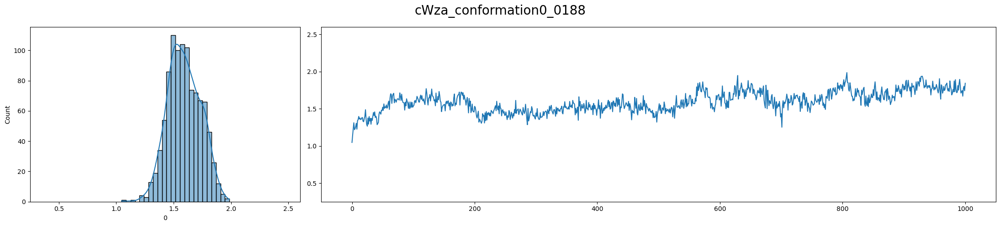

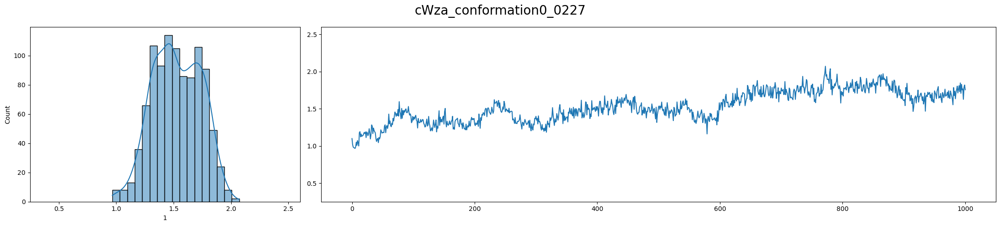

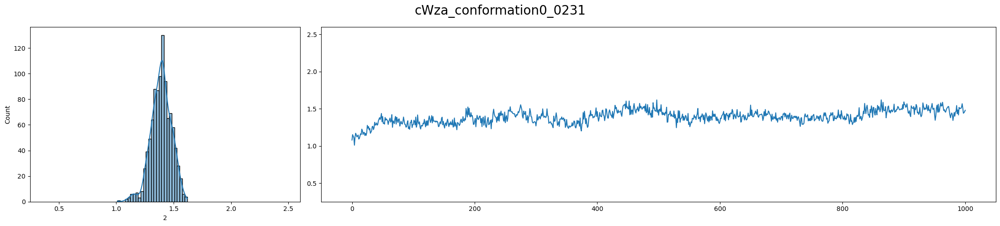

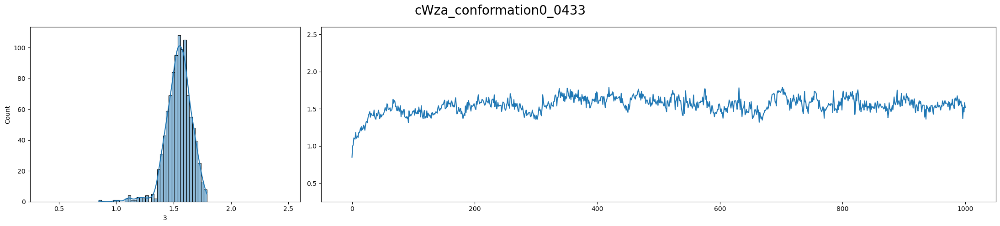

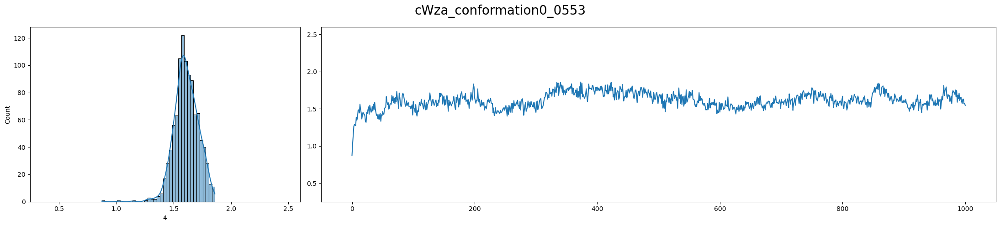

...

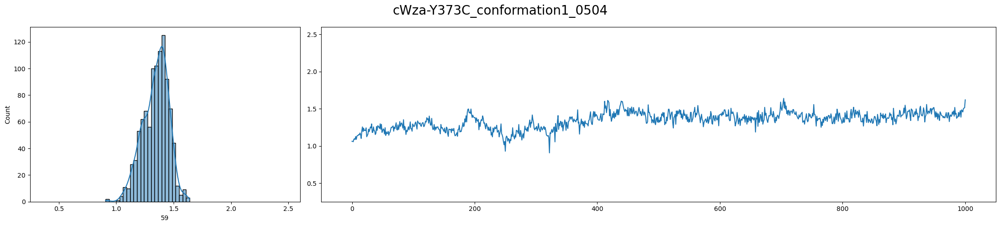

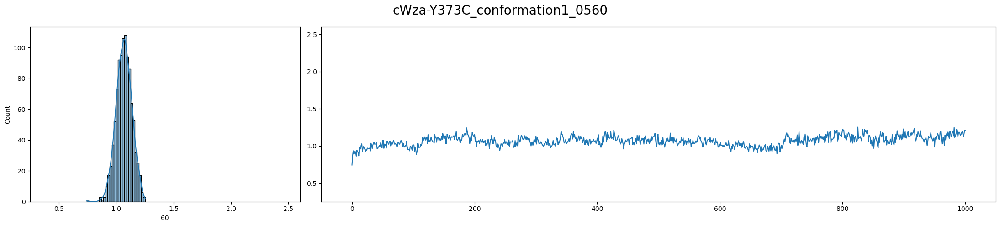

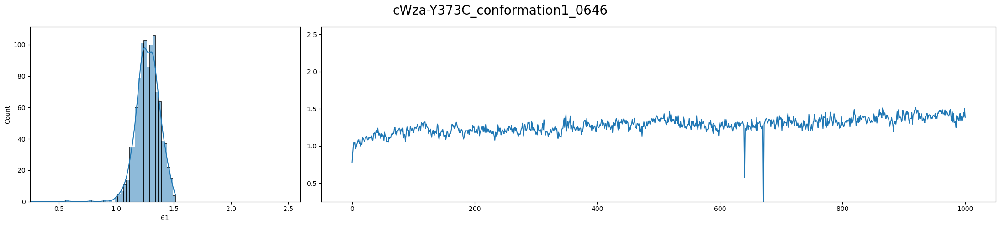

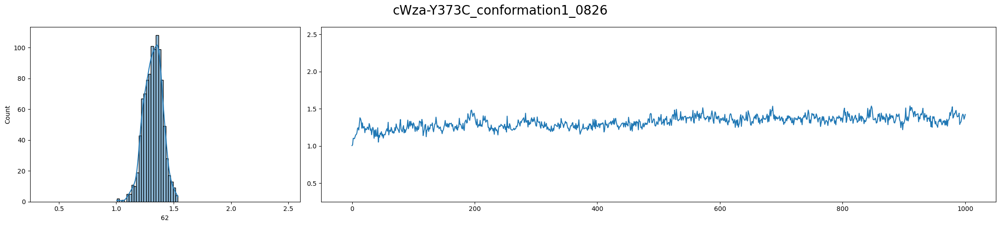

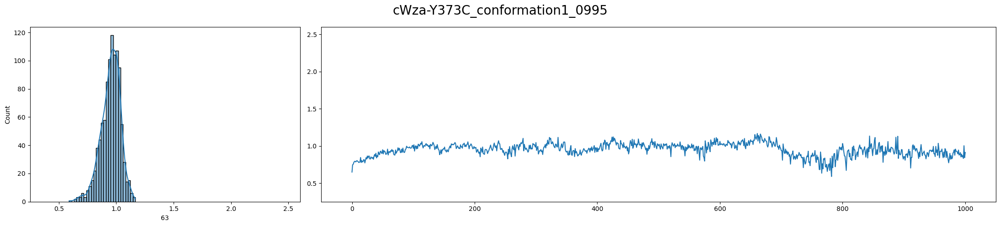

In [104]:
for i in range(len(df.columns)):
    
    fig = plt.figure(figsize=(22,5), dpi=100)
    gs = fig.add_gridspec(1, 2, width_ratios=[1,2.5])
    axes = (plt.subplot(gs[0,0]), plt.subplot(gs[0, 1]))
    
    sns.histplot(data=df, x=i, kde=True, ax=axes[0])
    axes[1].plot(df[i])
    
    axes[0].set_xlim(0.25,2.6)
    axes[1].set_ylim(0.25,2.6)
    
    fig.suptitle(model_names[i], fontsize=20)
    fig.tight_layout()
    
plt.show()

# H-bonds data 

In [366]:
HBA_data = {}
for outdir in dirnames:
    model_name = outdir.split('/')[-1]

    with open(os.path.join(outdir, "md_100ns.hbonds.pickle"),'rb') as fp:
        X = pickle.load(fp)
        
    HBA_data[model_name] = {k:X[k]['time'] for k,v in X.items()}

# Heatmaps: Models Vs H-bonds

In [499]:
df = pd.DataFrame.from_dict({model_name: {hbond: np.sum(HBA_data[model_name][hbond])/1000 for hbond in HBA_data[model_name].keys()} for model_name in HBA_data.keys()})

In [502]:
df = df.fillna(0)
hbonds_sorted = sorted(df.index, key=lambda hbond:sum(df.loc[hbond]), reverse=True)
df = df.reindex(hbonds_sorted)

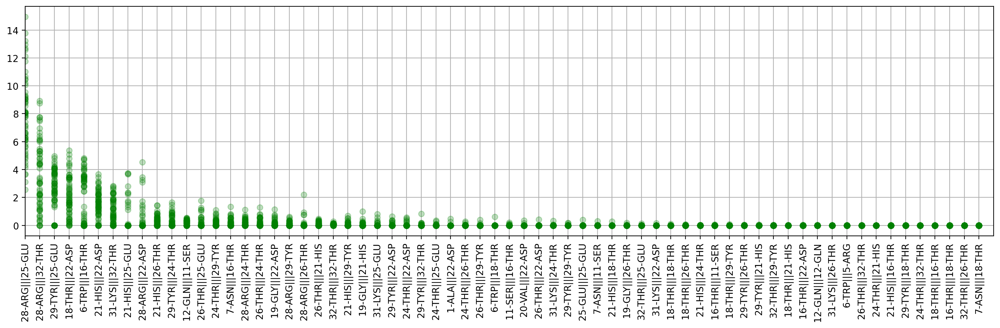

In [504]:
fig,ax = plt.subplots(1,1,figsize=(15,5),dpi=200)

df.plot(marker='o',color='green',linestyle='',alpha=0.25, ax=ax)

ax.set_xticks(range(len(df.index)))
hbonds_labels = [x[0]+'|||'+x[1] for x in df.index]
ax.set_xticklabels(hbonds_labels, rotation=90)

ax.set_xlim(0,len(df.index))
ax.grid(True)
legend = ax.legend()
legend.remove()
fig.tight_layout()

plt.show()

In [546]:
keep_hbonds = [max(df.loc[hbonds]) > 2 for hbonds in df.index]
df_trimmed = df[keep_hbonds]

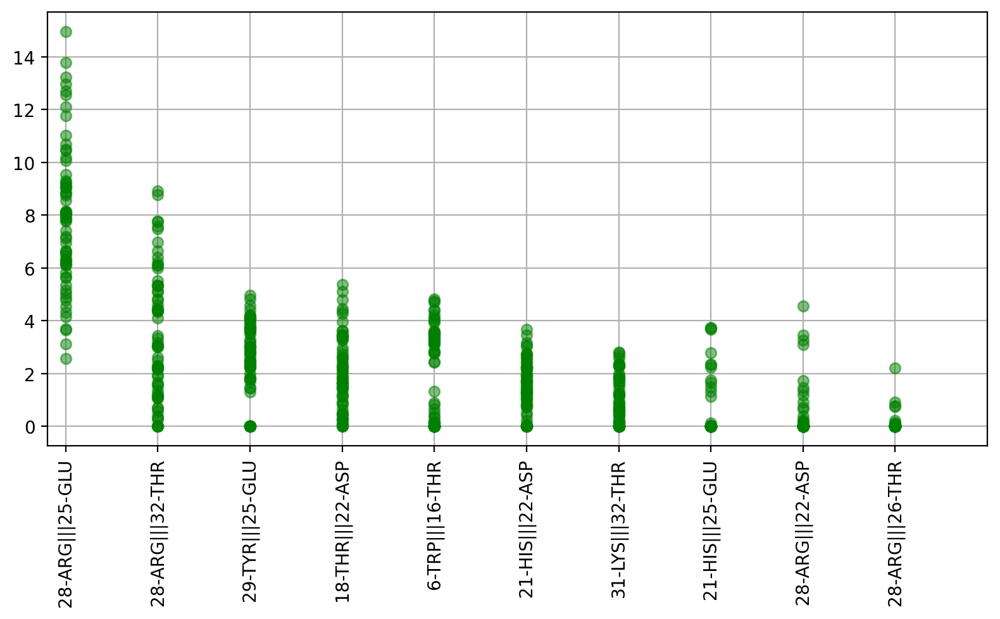

In [551]:
fig,ax = plt.subplots(1,1,figsize=(8,5),dpi=200)

df_trimmed.plot(marker='o',linestyle='',color='green',alpha=0.5, ax=ax)

ax.set_xticks(range(len(df_trimmed.index)))
hbonds_labels = [x[0]+'|||'+x[1] for x in df_trimmed.index]
ax.set_xticklabels(hbonds_labels, rotation=90)

ax.set_xlim(-0.2,len(df_trimmed.index))
ax.grid(True)
legend = ax.legend()
legend.remove()


fig.tight_layout()
plt.show()

In [552]:
keep_hbonds = [max(df.loc[hbonds]) > 2 for hbonds in df.index]
df_trimmed = df[keep_hbonds]
df_trimmed = df_trimmed.iloc[::-1]

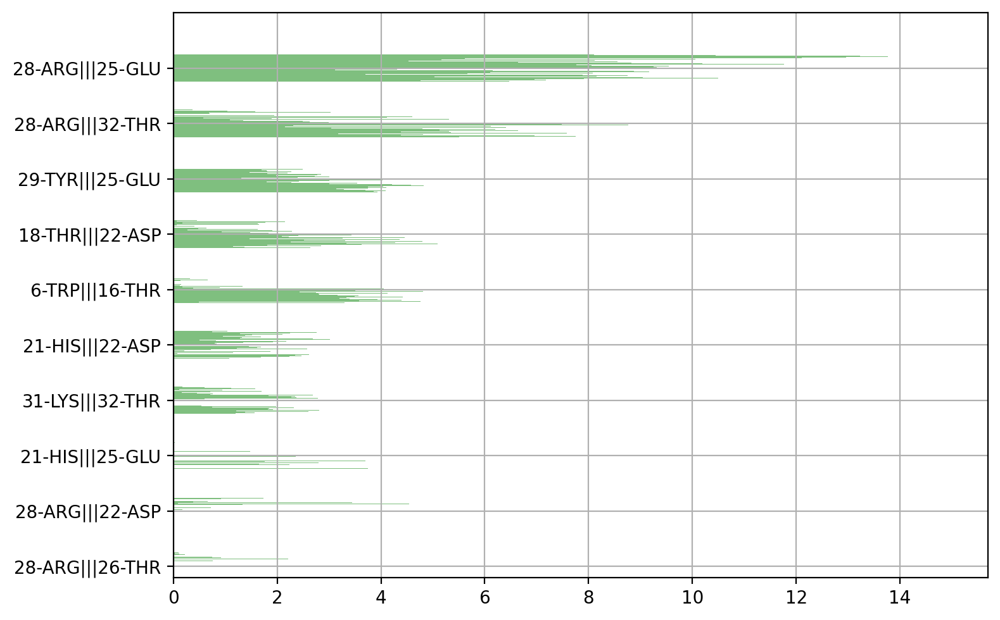

In [553]:
fig,ax = plt.subplots(1,1,figsize=(8,5),dpi=200)

df_trimmed.plot(kind='barh',color='green',alpha=0.5, ax=ax)

ax.set_yticks(range(len(df_trimmed.index)))
hbonds_labels = [x[0]+'|||'+x[1] for x in df_trimmed.index]
ax.set_yticklabels(hbonds_labels, rotation=0)

ax.set_ylim(-0.2,len(df_trimmed.index))
ax.grid(True)
legend = ax.legend()
legend.remove()


fig.tight_layout()
plt.show()

# Timeseries correlations

TO-DOs

* Rank H-bond data from high to low in terms of total counts
* Compute correlations with this sorted data
* Output/print the identity of these H-bonds along with the correlation and p-value
* Also rank H-bonds from high to low according to correlation and p-value

Proof of concept

In [398]:
from scipy import stats

for outdir in dirnames:
    model_name = outdir.split('/')[-1]

    Y = stats.zscore(HOLE_data[model_name])
    
    X = HBA_data[model_name]
    data_matrix = np.array([X[key] for key in X.keys()])
    hbonds_list_sorted = np.array(list(X.keys()))[np.argsort(data_matrix.sum(axis=1))][::-1]
    data_matrix_sorted = data_matrix[np.argsort(data_matrix.sum(axis=1)),:][::-1]
    
    Corr = stats.spearmanr
    YX_correlations = [[list(hbonds_list_sorted[i]),list(Corr(Y, Xi+1, axis=None))] for i, Xi in enumerate(data_matrix_sorted)]

In [134]:
N_hbonds = len(data_matrix_sorted)
fig,ax = plt.subplots(N_hbonds+1, 1, figsize=(15,24), sharex=True, dpi=200)

#ax[0].plot(stats.zscore(Y), color='orange')
ax[0].plot(Y, color='orange')
ax[0].set_title("Estimated Conductance: "+ model_name)

for i in range(N_hbonds):
    Z = data_matrix_sorted[i]
    #ax[i+1].plot(stats.zscore(Z))
    ax[i+1].plot(Z)
    
    x = hbonds_list_sorted[i]
    title = x[0]+'|||'+x[1]
    ax[i+1].set_title(title)

fig.tight_layout()
p = plt.savefig('data/figs/foo.png', bbox_inches='tight',facecolor='white',transparent=False)
plt.close()

Loop

In [135]:
from scipy import stats

for outdir in dirnames:
    model_name = outdir.split('/')[-1]

    Y = HOLE_data[model_name]
    
    X = HBA_data[model_name]
    data_matrix = np.array([X[key] for key in X.keys()])
    hbonds_list_sorted = np.array(list(X.keys()))[np.argsort(data_matrix.sum(axis=1))][::-1]
    data_matrix_sorted = data_matrix[np.argsort(data_matrix.sum(axis=1)),:][::-1]
    
    Corr = stats.pearsonr
    YX_correlations = [Corr(Y, data_matrix_sorted[i]) for i in range(len(data_matrix_sorted))]

    N_hbonds = len(data_matrix_sorted)
    fig,ax = plt.subplots(N_hbonds+1, 1, figsize=(15,24), sharex=True, dpi=200)

    #ax[0].plot(stats.zscore(Y), color='orange')
    ax[0].plot(Y, color='orange')
    ax[0].set_title("Estimated Conductance: "+ model_name)

    for i in range(N_hbonds):
        Z = data_matrix_sorted[i]
        #ax[i+1].plot(stats.zscore(Z))
        ax[i+1].plot(Z)

        x = hbonds_list_sorted[i]
        title = x[0]+'|||'+x[1]
        ax[i+1].set_title(title)

    fig.tight_layout()
    p = plt.savefig('data/figs/'+model_name+'.png', bbox_inches='tight',facecolor='white',transparent=False)
    plt.close()

In [411]:
Z = sorted(YX_correlations, key=lambda x:x[1][1])
Z 

[[['31-LYS', '25-GLU'], [-0.3635007625757515, 1.2478104858579003e-32]],
 [['28-ARG', '26-THR'], [-0.307412888653216, 2.3735827248420177e-23]],
 [['26-THR', '25-GLU'], [-0.2833772756194861, 6.102207961191438e-20]],
 [['24-THR', '25-GLU'], [0.26365527135906297, 2.217836871725185e-17]],
 [['31-LYS', '32-THR'], [0.221769405504189, 1.2818984599137697e-12]],
 [['18-THR', '22-ASP'], [0.2115675717863084, 1.3607909471005242e-11]],
 [['28-ARG', '32-THR'], [-0.1865037167709913, 2.754764987415672e-09]],
 [['11-SER', '16-THR'], [0.18457113577469314, 4.031719186621704e-09]],
 [['26-THR', '24-THR'], [-0.11133152809413152, 0.00041721732457237164]],
 [['7-ASN', '16-THR'], [0.10917712970532911, 0.0005396900880202492]],
 [['28-ARG', '25-GLU'], [0.1080688134524886, 0.0006150099171088377]],
 [['12-GLN', '11-SER'], [-0.10494840653206326, 0.0008827360069180805]],
 [['32-THR', '32-THR'], [-0.07364607713489346, 0.019789704184387972]],
 [['28-ARG', '22-ASP'], [0.07019338700348708, 0.026365580485580256]],
 [['24